# Importing Necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')
from math import pi
from mpl_toolkits.mplot3d import Axes3D
from statistics import median,mode
import plotly.express as px
from plotly.subplots import make_subplots
from bokeh.plotting import figure, show, output_notebook
from bokeh.models import HoverTool
from bokeh.layouts import gridplot
output_notebook()
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from sklearn.metrics import davies_bouldin_score,silhouette_score

Loading BokehJS ...

# Importing the dataset

In [2]:
df=pd.read_csv('Fifa_data.csv')

df

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


# Domain Analysis

In [3]:
with open('data_description.txt', 'r', encoding='utf-8') as file:
    for line in file:
        print(line, end='') 

Feature Information:-
●SalePrice: The property's sale price in dollars. 
●MSSubClass: The building class
●MSZoning: The general zoning classification
●LotFrontage: Linear feet of street connected to property
●LotArea: Lot size in square feet
●Street: Type of road access
●Alley: Type of alley access
●LotShape: General shape of property
●LandContour: Flatness of the property
●Utilities: Type of utilities available
●LotConfig: Lot configuration
●LandSlope: Slope of property
●Neighborhood: Physical locations within Ames city limits
●Condition1: Proximity to main road or railroad
●Condition2: Proximity to main road or railroad (if a second is present)
●BldgType: Type of dwelling
●HouseStyle: Style of dwelling
●OverallQual: Overall material and finish quality
●OverallCond: Overall condition rating
●YearBuilt: Original construction date
●YearRemodAdd: Remodel date
●RoofStyle: Type of roof
●RoofMatl: Roof material
●Exterior1st: Exterior covering on house
●Exterior2nd: Exterior covering on hous

# Basic Checks

In [4]:
pd.set_option('Display.max_columns',None)
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

In [5]:
df.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,48,56,40000,2000,CB,Right,1,3,2,Medium/High,Normal,No,70000.0,NaN,RES,36.0,NaN,2018-07-13,2019.0,NaN,NaN,57.0,23.0,28.0,33.0,47.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,52,5,5,13,5,14,32+2,32+2,32+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,33+2,33+2,33+2,33+2,33+2,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,48,56,40000,2000,CB,Right,1,2,2,Medium/Medium,Normal,No,72000.0,NaN,SUB,31.0,NaN,2019-02-01,2022.0,NaN,NaN,58.0,24.0,33.0,35.0,48.0,48.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,57,13,6,14,11,9,33+2,33+2,33+2,33+2,32+2,32+2,32+2,33+2,33+2,33+2,33+2,35+2,36+2,36+2,36+2,35+2,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,48,56,40000,1000,CM,Right,1,2,2,Low/Medium,Lean,No,70000.0,NaN,SUB,38.0,NaN,2019-01-01,2019.0,NaN,NaN,54.0,35.0,44.0,45.0,48.0,51.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,46,7,8,10,6,14,43+2,43+2,43+2,43+2,43+2,43+2,43+2,43+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,45+2,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,48,54,40000,1000,CM,Right,1,2,2,Low/Low,Lean,No,70000.0,NaN,SUB,33.0,NaN,2019-02-01,2022.0,NaN,NaN,59.0,35.0,47.0,47.0,45.0,52.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,54,14,9,13,13,13,43+2,43+2,43+2,45+2,44+2,44+2,44+2,45+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,48,51,40000,2000,CM,Right,1,3,2,Medium/Medium,Normal,No,NaN,NaN,SUB,37.0,Tianjin TEDA FC,NaN,2019.0,NaN,NaN,60.0,32.0,51.0,45.0,47.0,55.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44,30,48,58,25,40,34,35,52,46,54,64,52,49,71,41,64,40,61,30,54,47,29,52,38,42,52,42,48,8,12,14,9,10,42+2,42+2,42+2,44+2,43+2,43+2,43+2,44+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,46+2,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


In [6]:
df.shape

(18278, 104)

In [7]:
df.size

1900912

In [8]:
df.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

In [9]:
df.select_dtypes(include=['object']).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 43 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   player_url        18278 non-null  object
 1   short_name        18278 non-null  object
 2   long_name         18278 non-null  object
 3   dob               18278 non-null  object
 4   nationality       18278 non-null  object
 5   club              18278 non-null  object
 6   player_positions  18278 non-null  object
 7   preferred_foot    18278 non-null  object
 8   work_rate         18278 non-null  object
 9   body_type         18278 non-null  object
 10  real_face         18278 non-null  object
 11  player_tags       1499 non-null   object
 12  team_position     18038 non-null  object
 13  loaned_from       1048 non-null   object
 14  joined            16990 non-null  object
 15  nation_position   1126 non-null   object
 16  player_traits     7566 non-null   object
 17  ls          

In [10]:
df.select_dtypes(exclude=['object']).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Data columns (total 61 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   sofifa_id                   18278 non-null  int64  
 1   age                         18278 non-null  int64  
 2   height_cm                   18278 non-null  int64  
 3   weight_kg                   18278 non-null  int64  
 4   overall                     18278 non-null  int64  
 5   potential                   18278 non-null  int64  
 6   value_eur                   18278 non-null  int64  
 7   wage_eur                    18278 non-null  int64  
 8   international_reputation    18278 non-null  int64  
 9   weak_foot                   18278 non-null  int64  
 10  skill_moves                 18278 non-null  int64  
 11  release_clause_eur          16980 non-null  float64
 12  team_jersey_number          18038 non-null  float64
 13  contract_valid_until        180

# Insights
There are 61 numerical columns and 43 categorical columns.
There are total 18278 entries and 104 columns.
16 columns have missing values

In [11]:
df.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,skill_moves,release_clause_eur,team_jersey_number,contract_valid_until,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,18278.000000,1.698000e+04,18038.000000,18038.000000,1126.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,16242.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,2036.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,2.368038,4.740717e+06,20.103892,2021.114591,12.114565,67.700899,52.298301,57.233777,62.531585,51.553503,64.876678,65.422397,63.146365,61.832515,66.390472,37.798625,63.374754,49.718405,45.590218,52.221468,58.748003,42.809388,55.596509,47.325692,42.708885,52.768848,58.461976,64.299923,64.415746,63.504924,61.752544,63.856439,58.181694,64.928165,62.889485,65.234763,46.812945,55.742149,46.380239,50.072163,53.609749,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,0.765038,1.103002e+07,16.603639,1.289888,6.735922,11.297656,14.029418,10.407844,10.284950,16.419528,9.760162,7.736278,7.244023,7.510709,8.154062,10.634038,8.447876,18.325403,19.594609,17.428429,14.679653,17.701815,18.929118,18.422991,17.433612,15.246454,16.741878,15.042232,14.847763,14.808380,9.135613,14.201559,13.326083,11.934059,16.017954,12.534811,19.322343,17.318157,20.775812,19.594022,13.955626,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,1.300000e+04,1.000000,2019.000000,1.000000,24.000000,15.000000,24.000000,23.000000,15.000000,27.000000,44.000000,42.000000,35.000000,45.000000,12.000000,41.000000,5.000000,2.000000,5.000000,7.000000,3.000000,4.000000,6.000000,4.000000,8.000000,5.000000,12.000000,11.000000,11.000000,21.000000,12.000000,14.000000,19.000000,12.000000,20.000000,4.000000,9.000000,3.000000,2.000000,9.000000,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,2.000000,5.630000e+05,9.000000,2020.000000,6.000000,61.000000,42.000000,50.000000,57.000000,36.000000,59.000000,60.000000,58.000000,57.000000,60.750000,29.000000,58.000000,38.000000,30.000000,44.000000,54.000000,30.000000,50.000000,34.000000,31.000000,43.000000,54.000000,56.000000,57.

# Insights

- Most players are aged between 16 and 30 years, with the average age being around 25 years.
- This distribution follows a normal pattern.
- The youngest player is 16 years old, while the oldest age is 42 years.
- Both height and weight follow a normal distribution with the mean and median being approximately equal.
- The minimum value and wage paid to players are found to be 0 euros.
- The average player value is around €2.48 million, with significant variation.
- The minimum player value is €0.0.
- Most players (75%) have an international reputation rating of 1 on a scale of 1 to 5.
- This indicates that the majority of players are not widely recognized on an international level.
- `sofifa_id`, `team_jersey_number`, and `nation_jersey_number` are generally irrelevant.
- These columns do not provide information about the players' abilities or attributes and are mainly identifiers or categorical information.
- Most players utilize their weak foot potential at an average level.
- The weak foot rating averages around 2.9 on a scale of 1 to 5.
- The average pace rating of players is around 67, with the median being 69, indicating a close to normal distribution.
- Pace ranges from 24 to 96, with 25% of players having a rating above 75.
- 75% of players have shooting skills rated between 14 and 63.
- Only the top 25% have ratings between 63 and 93, indicating a wide variation in shooting abilities.
- Shooting, dribbling, and passing skills, on average, follow a normal distribution.
- The majority of players (75%) have goalkeeping skills (reflexes, positioning, kicking, handling, and diving) rated between 1 and 14 on a scale of 1 to 100.
- This reflects that goalkeeping is a specialized skill possessed by a minority.
- `gk_diving`, `gk_handling`, `gk_kicking`, `gk_reflexes`, `gk_speed`, and `gk_positioning` columns have only 2036 entries.
- Unless a player plays at a Goalkeeper position (GW), all his goalkeeper statistics are NaNs.
- On average, players' movement skills are rated as follows:
  - Sprint speed at 64
  - Agility at 63
  - Reactions at 61
- The highest rating observed for a player with exceptional movement skills is 96.


In [12]:
df.describe(include='O')

,player_url,short_name,long_name,dob,nationality,club,player_positions,preferred_foot,work_rate,body_type,real_face,player_tags,team_position,loaned_from,joined,nation_position,player_traits,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
count,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,18278,1499,18038,1048,16990,1126,7566,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242,16242
unique,18278,17354,18218,6142,162,698,643,2,9,10,2,83,29,316,1760,26,921,94,94,94,107,103,103,103,107,103,103,103,100,88,88,88,100,98,98,98,98,98,96,110,110,110,96
top,https://sofifa.com/player/158023/lionel-messi/...,J. Rodríguez,Liam Kelly,1992-02-29,England,FC Barcelona,CB,Right,Medium/Medium,Normal,No,#Strength,SUB,Sassuolo,2019-07-01,SUB,Early Crosser,61+2,61+2,61+2,63+2,63+2,63+2,63+2,63+2,61+2,61+2,61+2,61+2,58+2,58+2,58+2,61+2,59+2,59+2,59+2,59+2,59+2,61+2,63+2,63+2,63+2,61+2
freq,1,11,3,113,1667,33,2322,13960,9875,10750,16310,514,7820,17,1465,587,501,725,725,725,736,727,727,727,736,748,748,748,809,775,775,775,809,682,636,636,636,682,667,621,621,621,667


# INsights
 - Columns such as player_url, long_name, and dob are deemed irrelevant for clustering players based on skills.
 - Players in the dataset hail from a diverse range of 162 different countries worldwide.
 - More than 75% of the players predominantly use their right foot for playing.
 - Around 50% of the players exhibit a medium degree of effort in both attack and defense aspects of the game.
 - Columns like player_tags, loaned_from, and nation_position have a significant number of missing entries, indicating that more than 90% of the entries are null.
 - The player traits information is available for approximately 41% of the players, suggesting that a significant portion of the dataset lacks detailed trait descriptions for individual players.

# EDA

# Univariate Analysis

In [13]:
num_cols=['age','height_cm','weight_kg','overall','potential','pace','shooting','physic','movement_agility',
 'movement_reactions','power_shot_power','power_stamina','mentality_composure','mentality_vision',
 'defending_standing_tackle','mentality_penalties']
colors = ['navy', 'darkorange', 'darkgreen', 'darkred', 'indigo', 'saddlebrown', 'deeppink', 'dimgray',
 'darkolivegreen', 'darkcyan', 'darkslategray', 'darkseagreen', 'darkgoldenrod', 'crimson',
 'rebeccapurple', 'slategray']
figures=[]
for cols,color in zip(num_cols,colors):
    col_data = df[cols].dropna()
    hist, edges = np.histogram(col_data, bins=10)
    p = figure(title=f"Distribution of {cols}", tools=["pan", "wheel_zoom", "box_zoom", "save", "reset"], background_fill_color="#fafafa")
    p.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
         fill_color=color, line_color="white", alpha=0.9)
    p.xaxis.axis_label = cols
    p.yaxis.axis_label = 'Count'
    figures.append(p)
grid = gridplot(np.array(figures).reshape(4, 4).tolist(), width=250, height=250)
show(grid)


# Insights
 - We see that most of the players are in between 20 to 30 years of age.
 - The average height of players is approximately 180 cm, following a close to normal distribution. This suggests that most players fall within an optimal height range for professional football.
 - Most players weight between 65 to 80 kg, with the weight distribution also following a normal pattern. This weight range aligns with the physical requirements for maintaining speed, agility, and endurance on the field.
 - Very few players have an overall rating above 90, while the majority are rated between 65 and 70. This indicates a significant disparity in player performance levels, with a few elite players standing out due to exceptional skill and international reputation.
 - Most players have the potential to achieve ratings between 65 and 75, with a select few having the potential to exceed a rating of 90. This reflects the future growth prospects and career development trajectories, highlighting potential star players.
 - The pace attribute is slightly skewed to the left, with most players having a pace rating between 65 and 75. This distribution suggests that while many players are moderately fast, there is room for improvement in speed training for enhanced performance.
 - The skills for shooting, passing, dribbling, and defending are predominantly rated between 60 and 65. This indicates that most players possess a moderate level of technical skills.
 - The physic attribute is rated between 65 and 70 for most players, showing a concentration of players with good physical strength and endurance.
 - The agility of players is also normally distributed, centering around a mean value of approximately 63. This suggests that most players have moderate agility, with fewer players having extremely high or low agility.
 - Player reactions are normally distributed with a mean around 61. This implies that players generally have average reaction times, with fewer players displaying very quick or slow reactions. 
 - Stamina follows a normal distribution, centered around 69. This suggests that players generally have above-average stamina, which is critical for maintaining performance throughout the match.
 - Shot power is normally distributed, peaking around a mean value of 65. This indicates that most players have moderate shot power, with a significant portion having either lower or higher shot power.
 - Vision among players follows a slightly skewed normal distribution, with most players having a vision rating around 60. This suggests that the majority of players have average vision, crucial for making effective passes.
 - The ability to take penalties shows a normal distribution with a mean around 61. Most players are moderately skilled at taking penalties, indicating a common area for potential improvement in training.
 - Composure ratings are normally distributed around a mean of 60. This reflects that most players maintain average composure under pressure, an important trait for maintaining performance during crucial moments in a game.
 - Standing tackle ability has a bimodal distribution, with peaks around 40 and 70. This suggests two distinct groups of players: one with average standing tackle ability and another with higher proficiency, indicating specialized training or positional roles.


In [14]:
reputation=df.international_reputation.value_counts().index.to_list()
count=df.international_reputation.value_counts().values
foot=df.preferred_foot.value_counts().index.to_list()
foot_count=df.preferred_foot.value_counts().values
skill=df.skill_moves.value_counts().index.to_list()
skill_count=df.skill_moves.value_counts().values
work=df.work_rate.value_counts().index.to_list()
work_count=df.work_rate.value_counts().values


In [15]:
fig1 = px.pie(names=reputation, values=count, title='International Reputation Rating',
 width=400, height=400, hole=0.3, color_discrete_sequence=px.colors.qualitative.Pastel)
fig1.show()

In [16]:
fig2 = px.pie(names=foot, values=foot_count, title='Distribution of Preferred Foot by the players',
 width=400, height=400, hole=0.3)
fig2.show()


In [17]:
fig3 = px.pie(names=skill, values=skill_count, title=' Rating of Skill Moves of players',
 width=400, height=400, hole=0.3, color_discrete_sequence=px.colors.qualitative.Pastel)
fig3.show()

In [18]:
fig4 = px.pie(names=work, values=work_count, title='Distribution of Work Rate',
 width=450, height=450, hole=0.3)
fig4

In [19]:
cat_cols=['body_type','team_position']
df['body_type'] = df['body_type'].replace({'PLAYER_BODY_TYPE_25':'body_type_25'})
fig = make_subplots(rows=len(cat_cols), cols=1, subplot_titles=cat_cols)
for i, col in enumerate(cat_cols):
    col_value_counts = df[col].value_counts()
    fig.add_trace(
        go.Bar(
            x=col_value_counts.index,
            y=col_value_counts.values,
            marker_color='green',
            name=col
        ),
        row=i + 1,
        col=1
    )

# Update layout
fig.update_layout(
    height=500 * len(cat_cols),
    width=800,
    title='Categorical Column Distributions'
)

# Show the figure
fig.show()

# Insights
 - A significant majority of players, over 75%, prefer using their right foot.
 - More than 90% of players do not have a real face representation in the game. This indicates a potential area for improvement in terms of player personalization and visual realism
 - Approximately 50% of players are classified with a normal body type, while around 30% have a lean body type. The remaining players fall into other categories, including those specifically named after famous footballers such as Ronaldo, Messi, and Neymar etc.
 - Over 50% of players exhibit a medium work rate for both attacking and defensive roles. This suggests that most players have a balanced level of effort and involvement in both offensive and defensive actions, making them versatile assets on the field.
 - Around 15% of players have a high attacking work rate coupled with a medium defensive work rate. This indicates a subset of players who are heavily focused on offensive play.
 - Approximately 8% of players demonstrate high work rates in both attack and defense, showcasing exceptional stamina and effort.

In [20]:
x1=df.nationality.value_counts().index.to_list()
y1=df.nationality.value_counts().values
x2=df.club.value_counts().index.to_list()
y2=df.club.value_counts().values

In [21]:
x1=x1[0:10]
y1=y1[0:10]


In [22]:
fig1=px.bar(x=x1,y=y1)
fig1.update_layout(
 title='Distribution of Players of top 10 Nationalities',
 xaxis_title='Nationality',
 yaxis_title='Frequency',
 title_font=dict(size=20, family='Arial', color='navy'),title_x=0.5, title_y=0.95
 )

# Insight
 - The high representation of players from England, Germany, Spain and France reflects the strong footballing traditions and infrastructure in these countries.


In [23]:
fig2=px.bar(x=x2,y=y2)
fig2.update_layout(
 title='Distribution of Players of different Clubs',
 xaxis_title='Club',
 yaxis_title='Frequency',
 title_font=dict(size=20, family='Arial', color='navy'),title_x=0.5, title_y=0.95)


In [24]:
fig3=px.histogram(df,x='value_eur',title='Distribution of value of the Players',
 labels={'value_eur': 'Value (EUR)', 'count': 'Number of Players'})
fig3.update_layout(bargap=0.1,title_font=dict(size=20, family='Arial', color='navy'),title_x=0.5, title_y=0.95)
fig3.show()


# Insight
 - The presence of multiple clubs with similar levels of representation highlights the competitive balance.
 - 50 teams have 33 players each.

# Bivariate Analysis

In [25]:
offensive_positions = ['ST', 'RW', 'LW']
offensive_players = df[df['player_positions'].str.contains('|'.join(offensive_positions))]
def map_position(position):
     if 'ST' in position:
        return 'Striker'
     elif 'RW' in position:
        return 'Right-Winger'
     elif 'LW' in position:
        return 'Left-Winger'
     else:
        return 'Other'
offensive_players['offensive_position'] = offensive_players['player_positions'].apply(map_position)

offensive_players = offensive_players[offensive_players['offensive_position'].isin(['Striker', 'Right-Winger', 'Left-Winger'])]
fig = px.box(offensive_players, x='offensive_position', y='wage_eur',
 title='Comparison of Wages for Offensive Players',
 labels={'offensive_position': 'Offensive Position', 'wage_eur': 'Wage (EUR)'},
 color='offensive_position',
 color_discrete_map={'Striker': 'red', 'Right-Winger': 'blue', 'Left-Winger': 'green'})
fig.show()

# Insight
Strikers tends to get paid more compare to other offensive players

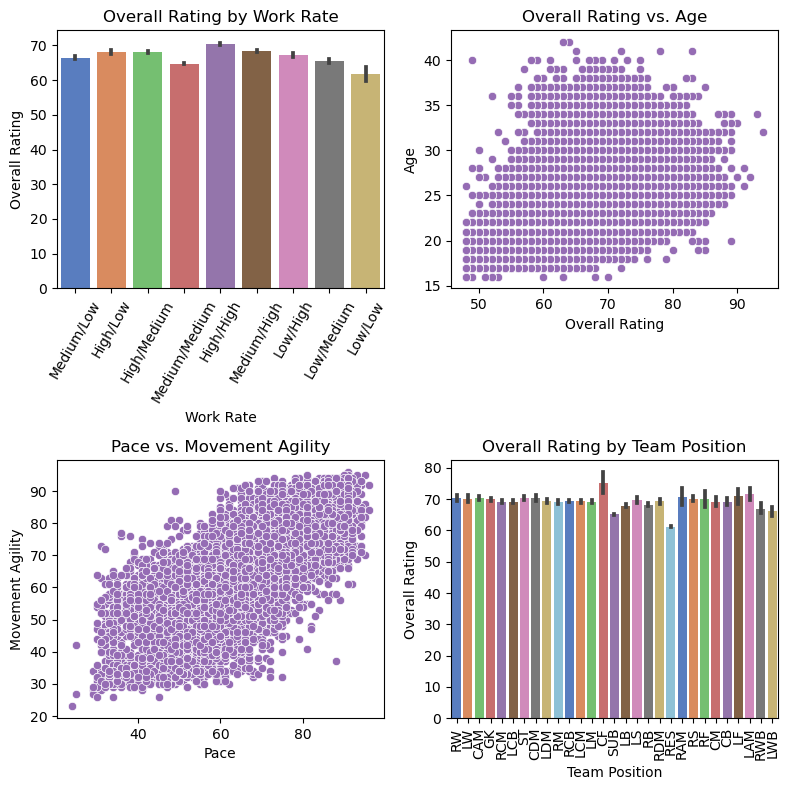

In [26]:
plt.figure(figsize=(8,8))
colors = sns.color_palette('muted')
plt.subplot(2,2,1)
sns.barplot(df,x='work_rate',y='overall',palette=colors)
plt.xticks(rotation=60)
plt.title('Overall Rating by Work Rate')
plt.xlabel('Work Rate')
plt.ylabel('Overall Rating')
plt.subplot(2,2,2)
sns.scatterplot(df,x='overall',y='age',color=colors[4])
plt.title('Overall Rating vs. Age')
plt.xlabel('Overall Rating')
plt.ylabel('Age')
plt.subplot(2,2,3)
sns.scatterplot(df,x='pace',y='movement_agility',color=colors[4])
plt.title('Pace vs. Movement Agility')
plt.xlabel('Pace')
plt.ylabel('Movement Agility')
plt.subplot(2,2,4)
sns.barplot(df,y='overall',x='team_position',palette=colors)
plt.title('Overall Rating by Team Position')
plt.xlabel('Team Position')
plt.ylabel('Overall Rating')
plt.xticks(rotation=90)
plt.tight_layout()

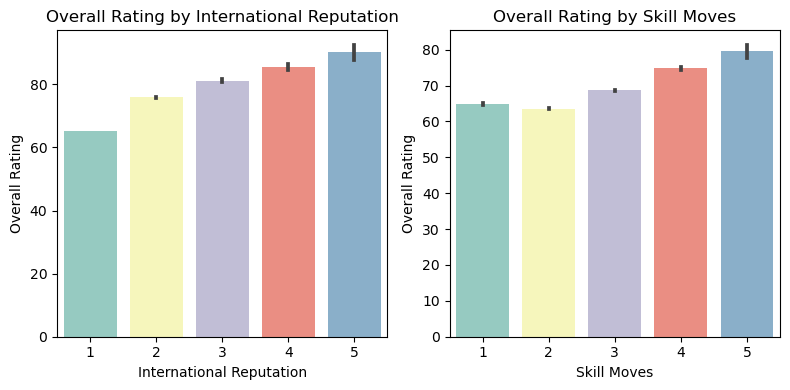

In [27]:
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
sns.barplot(df,y='overall',x='international_reputation',palette="Set3")
plt.title('Overall Rating by International Reputation')
plt.xlabel('International Reputation')
plt.ylabel('Overall Rating')
plt.subplot(1,2,2)
sns.barplot(df,y='overall',x='skill_moves',palette="Set3")
plt.title('Overall Rating by Skill Moves')
plt.xlabel('Skill Moves')
plt.ylabel('Overall Rating')
plt.tight_layout()

# Insights
- Players with 'High' work rates in either offense, defense, or both tend to have higher overall ratings.
- There is a noticeable peak in overall ratings around the ages of 25 to 30, indicating that players are often at their prime during these years.
- Younger players (<20) and older players (>35) tend to have lower overall ratings.
- A positive correlation exists between pace and movement agility, indicating that faster players are often more agile.
- The distribution of overall ratings is relatively uniform across different team positions.
- Certain positions such as 'CB' (Center Back) and 'GK' (Goalkeeper) show slightly higher variability.
- Players with higher international reputations tend to have significantly higher overall ratings.
- Players with higher skill moves ratings tend to have higher overall ratings.
- This suggests that technical skills, reflected by skill moves, are crucial for achieving higher overall ratings.


# Multivariate Analysis

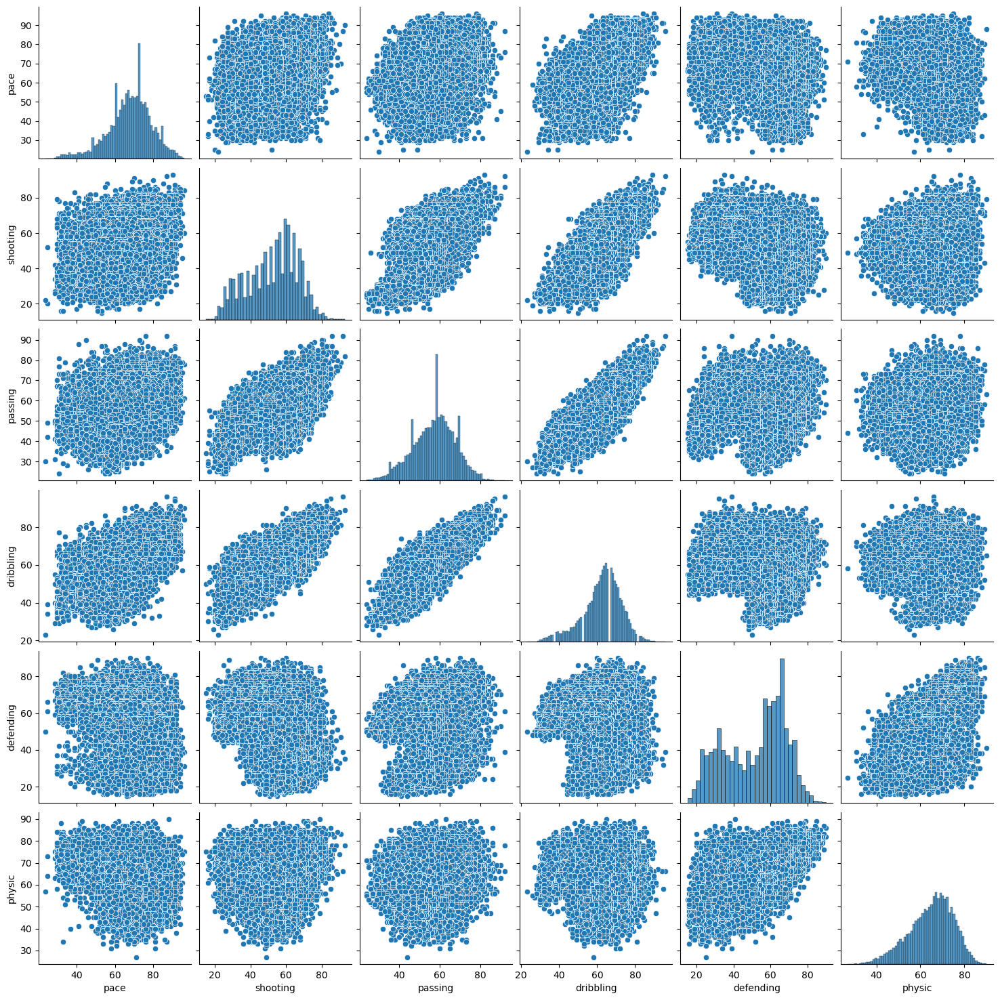

In [28]:
sns.pairplot(df[['pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic']])
plt.show()


# Insights
 - Players who excel in dribbling tend to have strong shooting capabilities as well.
 - A positive correlation exists between passing and shooting.
 - A positive correlation seen between dribbling and passing.

In [29]:
fig = plt.figure()
ax=px.scatter_3d(df,x='age',y='overall',z='value_eur')
ax.show()


<Figure size 640x480 with 0 Axes>

# Insights
 - The plot shows a concentration of players in the mid-20s to early 30s range with high overall ratings and relativelyhigher market values. This indicates that players typically reach their prime performance and value during these ages.
 - Younger players (around 18-22 years) have a wider spread in market value but generally have lower overall ratings.
 - Players above 30 tend to show a decline in overall rating and market value, reflecting the common career trajectory where physical and performance levels start to wane with age.

# Preprocessing

## Dropping unnecessary columns

In [30]:
df

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,player_tags,team_position,team_jersey_number,loaned_from,joined,contract_valid_until,nation_position,nation_jersey_number,pace,shooting,passing,dribbling,defending,physic,gk_diving,gk_handling,gk_kicking,gk_reflexes,gk_speed,gk_positioning,player_traits,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,ram,lm,lcm,cm,rcm,rm,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,94,94,95500000,565000,"RW, CF, ST",Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,"#Dribbler, #Distance Shooter, #Crosser, #FK Sp...",RW,10.0,NaN,2004-07-01,2021.0,NaN,NaN,87.0,92.0,92.0,96.0,39.0,66.0,NaN,NaN,NaN,NaN,NaN,NaN,"Beat Offside Trap, Argues with Officials, Earl...",88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,92+2,87+2,87+2,87+2,92+2,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,93,93,58500000,405000,"ST, LW",Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,"#Speedster, #Dribbler, #Distance Shooter, #Acr...",LW,7.0,NaN,2018-07-10,2022.0,LS,7.0,90.0,93.0,82.0,89.0,35.0,78.0,NaN,NaN,NaN,NaN,NaN,NaN,"Long Throw-in, Selfish, Argues with Officials,...",84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,"LW, CAM",Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,"#Speedster, #Dribbler, #Playmaker , #Crosser,...",CAM,10.0,NaN,2017-08-03,2022.0,LW,10.0,91.0,85.0,87.0,95.0,32.0,58.0,NaN,NaN,NaN,NaN,NaN,NaN,"Power Free-Kick, Injury Free, Selfish, Early C...",87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,90+3,89+3,82+3,82+3,82+3,89+3,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,NaN,GK,13.0,NaN,2014-07-16,2023.0,GK,1.0,NaN,NaN,NaN,NaN,NaN,NaN,87.0,92.0,78.0,89.0,52.0,90.0,"Flair, Acrobatic Clearance",13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,91,91,90000000,470000,"LW, CF",Right,4,4,4,High/Medium,Normal,Yes,184500000.0,"#Speedster, #Dribbler, #Acrobat",LW,7.0,NaN,2019-07-01,

In [31]:
obj_column=['sofifa_id','player_url','long_name','dob','player_tags','team_jersey_number','nation_jersey_number',
 'player_traits','ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm',
 'lwb','ldm','cdm','rdm','rwb','lb','lcb','cb','rcb','rb','short_name','nationality',"club"] 
df.drop(obj_column,axis=1,inplace=True)


# Insights-
 - 'ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm','cdm','rdm','rwb','lb','lcb','cb','rcb','rb' dropping player ratings for each individual position as they are already contained in othercolumns or could be determined from other columns.
 - Dropping unnecessary columns like sofifa_id','player_url','long_name','dob'.
 - player_tags,player_traits dependent on their skills, for which we already have rated columns, so considering dropping it.
 - team_jersey_number, nation_jersey_number are unnecessary columns, so dropping it for better analysis.
 - Dropping short_name','nationality',"club" since these are high cardinality columns, may impact the analysis.

# Handling player_positions column


In [32]:
df['player_positions'] = df['player_positions'].str.split(',').str[0]

### Converting 'joined' and 'contract_valid_until' column to datetime format

In [33]:
# converting date columns to datetime format
df['joined'] = pd.to_datetime(df['joined'], format='%Y-%m-%d')
df['contract_valid_until'] = pd.to_datetime(df['contract_valid_until'], format='%Y')

## Checking for null Values

In [34]:
df.isnull().sum()[df.isnull().sum()>0].count()

18

In [35]:
null_columns=df.isnull().sum()[df.isnull().sum()>0]
null_columns

release_clause_eur       1298
team_position             240
loaned_from             17230
joined                   1288
contract_valid_until      240
nation_position         17152
pace                     2036
shooting                 2036
passing                  2036
dribbling                2036
defending                2036
physic                   2036
gk_diving               16242
gk_handling             16242
gk_kicking              16242
gk_reflexes             16242
gk_speed                16242
gk_positioning          16242
dtype: int64

In [36]:
df.isnull().sum()[df.isnull().sum()>0.5*len(df)]

loaned_from        17230
nation_position    17152
gk_diving          16242
gk_handling        16242
gk_kicking         16242
gk_reflexes        16242
gk_speed           16242
gk_positioning     16242
dtype: int64

In [37]:
missing_cols=df.isnull().sum()[df.isnull().sum()>0.5*len(df)].index.to_list()

 1. Total 18 columns have null values.
2. There are total 8 columns with more than 50% of the values being null, dropping these columns for better analysis.
3. Imputing columns with less than 50% missing values.

In [38]:
df.drop(missing_cols,axis=1,inplace=True)

# Imputing Null Values

In [39]:
Imputing_cols=df.isnull().sum()[(df.isnull().sum()<0.5*len(df)) & (df.isnull().sum()>0) ].index.to_list()
Imputing_cols

['release_clause_eur',
 'team_position',
 'joined',
 'contract_valid_until',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic']

In [40]:
columns_to_remove=[1,2,3]
Imputing_cols=[col for idx,col in enumerate(Imputing_cols) if idx not in columns_to_remove]

In [41]:
def imputer(df,col):
         m=median(df[col].dropna())
         df[col]=df[col].apply(lambda x:m if pd.isna(x) else x)

In [42]:
for col in Imputing_cols:
     imputer(df,col)

In [43]:
a=df.team_position.loc[df.team_position.isnull()==True].index.to_list()

# Imputing Values of player positions with corresponding team position values


In [44]:
df.loc[a,'team_position']=df.player_positions.loc[df.team_position.isnull()==True].values

In [45]:
df['joined'].fillna(mode(df['joined']),inplace=True)
df['contract_valid_until'].fillna(mode(df['contract_valid_until']),inplace=True)

# Handling datetime columns

In [46]:
df['tenure_years'] = df['contract_valid_until'].dt.year - df['joined'].dt.year

In [47]:
df.drop(['joined','contract_valid_until'],axis=1,inplace=True)

# Handling outliers

In [48]:
df

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,tenure_years
0,32,170,72,94,94,95500000,565000,RW,Left,5,4,4,Medium/Low,Messi,Yes,195800000.0,RW,87.0,92.0,92.0,96.0,39.0,66.0,88,95,70,92,88,97,93,94,92,96,91,84,93,95,95,86,68,75,68,94,48,40,94,94,75,96,33,37,26,6,11,15,14,8,17
1,34,187,83,93,93,58500000,405000,ST,Right,5,4,5,High/Low,C. Ronaldo,Yes,96500000.0,LW,90.0,93.0,82.0,89.0,35.0,78.0,84,94,89,83,87,89,81,76,77,92,89,91,87,96,71,95,95,85,78,93,63,29,95,82,85,95,28,32,24,7,11,15,14,11,4
2,27,175,68,92,92,105500000,290000,LW,Right,5,5,5,High/Medium,Neymar,Yes,195200000.0,CAM,91.0,85.0,87.0,95.0,32.0,58.0,87,87,62,87,87,96,88,87,81,95,94,89,96,92,84,80,61,81,49,84,51,36,87,90,90,94,27,26,29,9,9,15,15,11,5
3,26,188,87,91,93,77500000,125000,GK,Right,3,3,1,Medium/Medium,Normal,Yes,164700000.0,GK,69.0,54.0,58.0,64.0,56.0,66.0,13,11,15,43,13,12,13,14,40,30,43,60,67,88,49,59,78,41,78,12,34,19,11,65,11,68,27,12,18,87,92,78,90,89,9
4,28,175,74,91,91,90000000,470000,LW,Right,4,4,4,High/Medium,Normal,Yes,184500000.0,LW,91.0,83.0,86.0,94.0,35.0,66.0,81,84,61,89,83,95,83,79,83,94,94,88,95,90,94,82,56,84,63,80,54,41,87,89,88,91,34,27,22,11,12,6,8,8,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,22,186,79,48,56,40000,2000,CB,Right,1,3,2,Medium/High,Normal,No,70000.0,RES,57.0,23.0,28.0,33.0,47.0,51.0,21,17,40,35,27,24,23,21,28,35,56,58,45,40,73,36,70,60,47,16,46,48,28,25,39,41,45,50,52,5,5,13,5,14,1
18274,22,177,66,48,56,40000,2000,CB,Right,1,2,2,Medium/Medium,Normal,No,72000.0,SUB,58.0,24.0,33.0,35.0,48.0,48.0,24,20,42,43,28,32,24,29,39,31,55,61,43,41,76,33,72,55,44,20,42,49,23,25,37,35,42,53,57,13,6,14,11,9,3
18275,19,186,75,48,56,40000,1000,CM,Right,1,2,2,Low/Medium,Lean,No,70000.0,SUB,54.0,35.0,44.0,45.0,48.0,51.0,32,33,49,53,32,40,32,32,55,49,55,54,52,52,57,48,60,50,51,26,50,45,38,38,36,39,46,52,46,7,8,10,6,14,0
18276,18,185,74,48,54,40000,1000,CM,Right,1,2,2,Low/Low,Lean,No,70000.0,SUB,59.0,35.0,47.0,47.0,45.0,52.0,39,34,47,54,28,42,37,39,48,49,55,63,55,54,59,46,61,42,55,28,57,49,31,48,36,40,39,44,54,14,9,13,13,13,3


In [49]:
num_var=['age', 'height_cm', 'weight_kg', 'overall', 'potential', 'value_eur','wage_eur','release_clause_eur', 'pace',
 'shooting', 'passing', 'dribbling', 'physic','attacking_heading_accuracy', 'attacking_short_passing',
 'skill_dribbling','skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control','movement_acceleration',
 'movement_sprint_speed', 'movement_agility','movement_reactions', 'movement_balance', 'power_shot_power',
 'power_jumping', 'power_stamina', 'power_strength','mentality_positioning', 'mentality_vision',
 'mentality_composure','goalkeeping_diving','goalkeeping_handling', 'goalkeeping_kicking',
 'goalkeeping_positioning', 'goalkeeping_reflexes']

In [50]:
len(num_var)

36

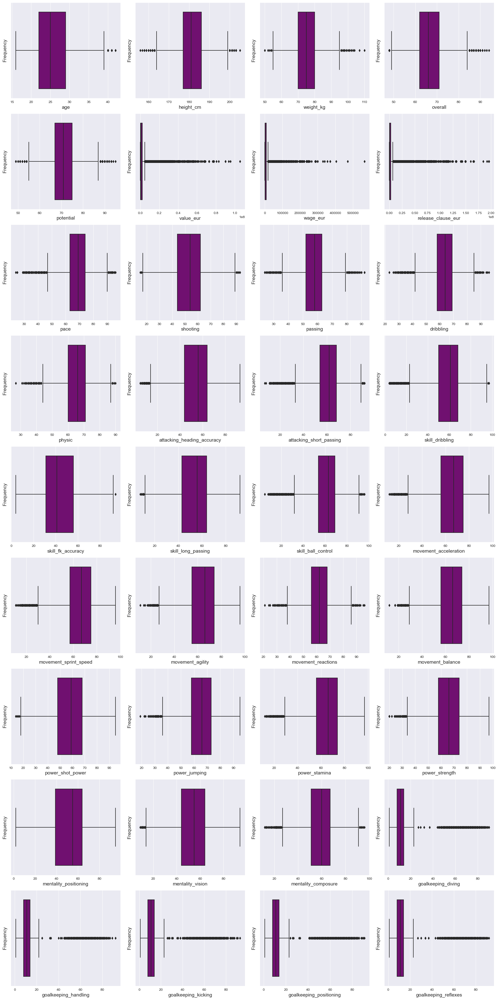

In [51]:
plt.figure(figsize=(20,40))
sns.set_style('darkgrid')

plot=1
for col in num_var:
     if plot<=36:
        plt.subplot(9,4,plot)
        sns.boxplot(data=df,x=col,color='purple')
        plt.xlabel(col,fontsize=14)
        plt.ylabel('Frequency',fontsize=14)
        plot+=1
plt.tight_layout()

# IQR Method

In [52]:
Q1=df[num_var].quantile(0.25)
Q3=df[num_var].quantile(0.75)

IQR=Q3-Q1

min_range=Q1-1.5*IQR
max_range=Q3+1.5*IQR

In [53]:
#outliers
outliers_count=((df[num_var]>max_range) | (df[num_var]<min_range)).sum()
print(outliers_count )

#Outliers percentage

print('=============================================================')
Outlier_prctg=(outliers_count/len(num_var))*100
print(Outlier_prctg) 

age                             19
height_cm                       89
weight_kg                       73
overall                        151
potential                      145
value_eur                     2511
wage_eur                      2360
release_clause_eur            2809
pace                           954
shooting                         9
passing                        564
dribbling                      814
physic                         433
attacking_heading_accuracy    1068
attacking_short_passing       1734
skill_dribbling               2035
skill_fk_accuracy                1
skill_long_passing              13
skill_ball_control            2051
movement_acceleration          405
movement_sprint_speed          499
movement_agility               209
movement_reactions             161
movement_balance               248
power_shot_power                 4
power_jumping                  426
power_stamina                  923
power_strength                 266
mentality_positionin

# Insights
nHandling outliers for columns by scaling instead of imputing values since it'll alter the distribution and rating

# Feature

# Handling higly correlated columns

In [54]:
corr_matrix = df[num_var].corr()

threshold = 0.85
high_corr = corr_matrix.abs() > threshold

for col in high_corr.columns:
     high_corr[col].loc[col] = False
        
high_corr_pairs = high_corr[high_corr.any(axis=1)]
high_corr_pairs

print("Highly correlated columns:")
for col in high_corr_pairs.columns:
     for idx in high_corr_pairs.index:
        if high_corr_pairs.at[idx, col]:
             print(f"{idx} and {col}: {corr_matrix.at[idx, col]:.2f}")

Highly correlated columns:
movement_reactions and overall: 0.86
wage_eur and value_eur: 0.86
release_clause_eur and value_eur: 0.98
value_eur and wage_eur: 0.86
value_eur and release_clause_eur: 0.98
skill_dribbling and attacking_short_passing: 0.85
skill_long_passing and attacking_short_passing: 0.90
skill_ball_control and attacking_short_passing: 0.92
attacking_short_passing and skill_dribbling: 0.85
skill_ball_control and skill_dribbling: 0.94
mentality_positioning and skill_dribbling: 0.90
attacking_short_passing and skill_long_passing: 0.90
attacking_short_passing and skill_ball_control: 0.92
skill_dribbling and skill_ball_control: 0.94
mentality_positioning and skill_ball_control: 0.87
movement_sprint_speed and movement_acceleration: 0.92
movement_acceleration and movement_sprint_speed: 0.92
overall and movement_reactions: 0.86
skill_dribbling and mentality_positioning: 0.90
skill_ball_control and mentality_positioning: 0.87
goalkeeping_handling and goalkeeping_diving: 0.97
goalk

<Axes: >

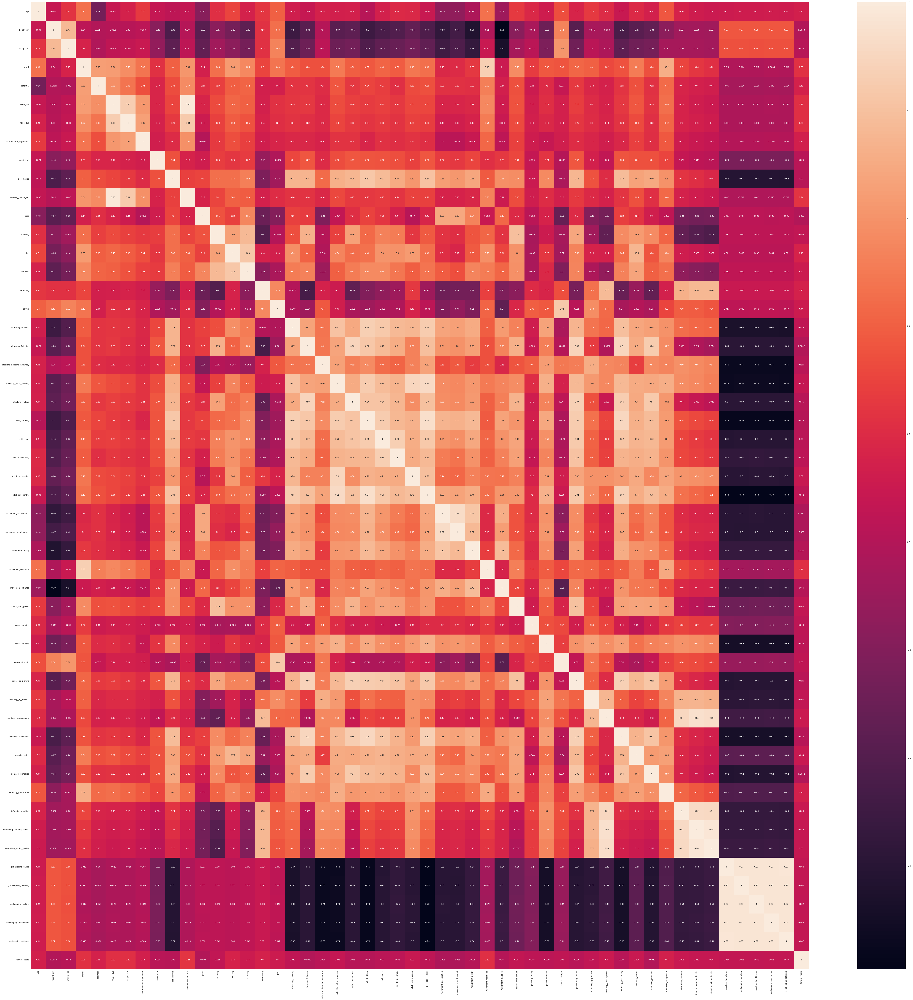

In [55]:
plt.figure(figsize=(80,80))
sns.heatmap(df.select_dtypes(exclude=['object']).corr(),annot=True)

# Insights
Handling highly correlated columns by performing feature extraction PCA teachnique.

# Encoding

In [56]:
from sklearn.preprocessing import LabelEncoder

In [57]:
L=LabelEncoder()

In [58]:
encoding_columns=df.select_dtypes(include='object').columns.to_list()

In [59]:
for i in encoding_columns:
     df[i]=L.fit_transform(df[i])

# Scaling

In [60]:
from sklearn.preprocessing import MinMaxScaler
numeric_columns = df.select_dtypes(include=['float64','int64']).columns
scaler = MinMaxScaler()
df[numeric_columns] = scaler.fit_transform(df[numeric_columns])

In [61]:
df.head(10)

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,player_positions,preferred_foot,international_reputation,weak_foot,skill_moves,work_rate,body_type,real_face,release_clause_eur,team_position,pace,shooting,passing,dribbling,defending,physic,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes,tenure_years
0,0.615385,0.285714,0.366667,1.000000,0.978261,0.905213,1.000000,12,0,1.00,0.75,0.75,7,4,1,1.000000,25,0.875000,0.987179,1.000000,1.000000,0.320000,0.619048,0.943182,1.000000,0.738636,1.000000,0.977011,1.000000,0.988636,1.000000,1.000000,1.000000,0.929412,0.858824,0.964706,0.986667,0.976471,0.888889,0.644737,0.741176,0.623377,1.000000,0.453488,0.415730,0.989247,1.000000,0.800000,1.000000,0.344086,0.367816,0.264368,0.056180,0.109890,0.152174,0.144444,0.076923,17
1,0.692308,0.632653,0.550000,0.978261,0.956522,0.554502,0.716814,14,1,1.00,0.75,1.00,1,1,1,0.492816,14,0.916667,1.000000,0.852941,0.904110,0.266667,0.809524,0.897727,0.989247,0.954545,0.894118,0.965517,0.913978,0.852273,0.800000,0.821429,0.956044,0.905882,0.941176,0.894118,1.000000,0.694118,1.000000,1.000000,0.858824,0.753247,0.988889,0.627907,0.292135,1.000000,0.858824,0.917647,0.988095,0.290323,0.310345,0.241379,0.067416,0.109890,0.152174,0.144444,0.109890,4
2,0.423077,0.387755,0.300000,0.956522,0.934783,1.000000,0.513274,8,1,1.00,1.00,1.00,2,5,1,0.996935,0,0.930556,0.897436,0.926471,0.986301,0.226667,0.492063,0.931818,0.913978,0.647727,0.941176,0.965517,0.989247,0.931818,0.922222,0.869048,0.989011,0.964706,0.917647,1.000000,0.946667,0.847059,0.814815,0.552632,0.811765,0.376623,0.888889,0.488372,0.370787,0.913978,0.952941,0.976471,0.976190,0.279570,0.241379,0.298851,0.089888,0.087912,0.152174,0.155556,0.109890,5
3,0.384615,0.653061,0.616667,0.934783,0.956522,0.734597,0.221239,5,1,0.50,0.50,0.00,8,6,1,0.841154,5,0.625000,0.500000,0.500000,0.561644,0.546667,0.619048,0.090909,0.096774,0.113636,0.423529,0.114943,0.086022,0.079545,0.111111,0.380952,0.274725,0.364706,0.576471,0.658824,0.893333,0.435294,0.555556,0.776316,0.341176,0.753247,0.088889,0.290698,0.179775,0.096774,0.658824,0.047059,0.666667,0.279570,0.080460,0.172414,0.966292,1.000000,0.836957,0.988889,0.967033,9
4,0.461538,0.387755,0.400000,0.934783,0.913043,0.853081,0.831858,8,1,0.75,0.75,0.75,2,6,1,0.942284,14,0.930556,0.871795,0.911765,0.972603,0.266667,0.619048,0.863636,0.881720,0.636364,0.964706,0.919540,0.978495,0.875000,0.833333,0.892857,0.978022,0.964706,0.905882,0.988235,0.920000,0.964706,0.839506,0.486842,0.847059,0.558442,0.844444,0.523256,0.426966,0.913978,0.941176,0.952941,0.940476,0.354839,0.252874,0.218391,0.112360,0.120879,0.054348,0.077778,0.076923,5
5,0.461538,0.510204,0.333333,0.934783,0.913043,0.853081,0.654867,0,1,0.75,1.00,0.75,0,6,1,0.850348,19,0.722222,0.910256,1.000000,0.863014,0.613333,0.809524,1.000000,0.860215,0.568182,1.000000,0.908046,0.881720,0.897727,0.877778,0.988095,0.945055,0.764706,0.764706,0.788235,0.933333,0.752941,0.950617,0.578947,0.905882,0.701299,0.955556,0.779070,0.651685,0.924731,1.000000,0.847059,0.940476,0.720430,0.609195,0.551724,0.157303,0.131868,0.043478,0.100000,0.131868,8
6,0.423077,0.632653,0.583333,0.913043,0.956522,0.639810,0.442478,5,1,0.50,0.75,0.00,8,6,1,0.732362,5,0.625000,0.500000,0.500000,0.561644,0.546667,0.619048,0.147727,0.129032,0.068182,0.635294,0.126437,0.182796,0.136364,0.088889,0.654762,0.274725,0.305882,0.458824,0.305882,0.866667,0.36

# Feature Extraction

# PCA

# plotting the graph of PCs, to analyse properly


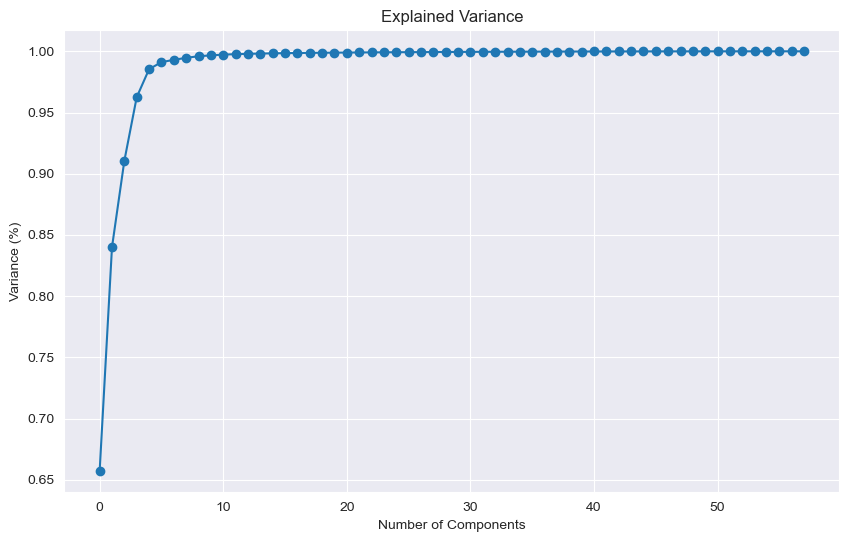

In [62]:
pca = PCA()
principalComponents = pca.fit_transform(df)
cumsum_explained_variance=np.cumsum(pca.explained_variance_ratio_)
 
plt.figure(figsize=(10, 6))
plt.plot(cumsum_explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Explained Variance')
plt.show()

# Insights
 - 2 components explaining more than 90% of the variance in the data.

In [63]:
pca=PCA(n_components=2)
principle_components=pca.fit_transform(df)

In [64]:
transformed_df=pd.DataFrame(principle_components,columns=['PC1','PC2'])

In [65]:
transformed_df.head()

,PC1,PC2
0,-4.967523,4.471629
1,5.214549,9.871280
2,20.108034,6.378255
3,15.845984,1.138229
4,6.345720,3.924676


In [66]:
transformed_df = transformed_df.values

# Model Implementation

# KMeans Clustering

### Elbow Method To detemine number of clusters to choose

In [67]:
wcss=[]
for i in range(1,11):
     model=KMeans(n_clusters=i,random_state=42)
     model.fit(transformed_df)
     wcss.append(model.inertia_)

Text(0.5, 0, 'WCSS')

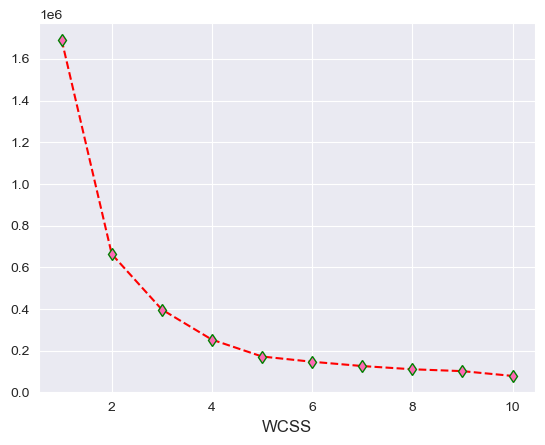

In [68]:
plt.plot(list(range(1,11)),wcss,'r--d',mec='g',mfc='hotpink')
plt.xlabel('WCSS',fontsize=12)


Since the graph is bending at 2 clusters, we will choose number of clusters as 3. Since the error is less as compared to 2
clusters.


In [69]:
model1=KMeans(n_clusters=3,random_state=42)
predicted_data=model1.fit_transform(transformed_df)
labels_kmeans=model1.fit_predict(transformed_df)

In [70]:
predicted_data

array([[ 0.5451834 , 18.93485926,  8.3690304 ],
       [11.46405306, 12.30574521, 16.11789993],
       [25.30180381,  8.49504628, 25.59926779],
       ...,
       [ 8.17297556, 20.81931407,  3.49950772],
       [ 8.05468028, 20.75056861,  3.47667363],
       [ 8.71002308, 20.89004394,  3.38495629]])

In [71]:
model1.labels_

array([0, 0, 1, ..., 2, 2, 2])

In [72]:
model1.cluster_centers_

array([[-5.1552957 ,  4.9834555 ],
       [13.62519757,  0.88838733],
       [-3.40250906, -3.74977006]])

In [73]:
# Model Evaluation

In [74]:
score=davies_bouldin_score(transformed_df,labels_kmeans)

In [75]:
print(score)

0.7992242332133581


In [76]:
silhouette_score(transformed_df,labels_kmeans)

0.49993404374301836

Text(0, 0.5, 'PCA Component 2')

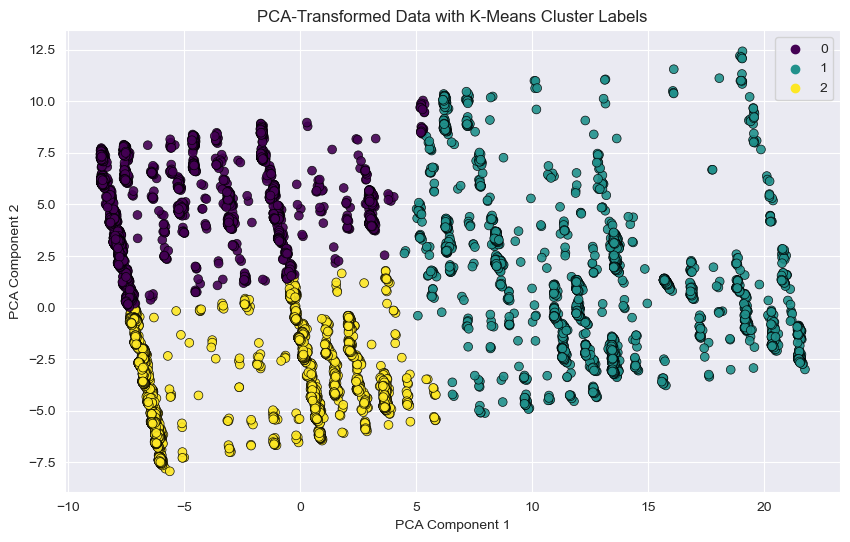

In [77]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=transformed_df[:,0], y=transformed_df[:,1], hue=labels_kmeans, palette='viridis', s=40,
 alpha=0.9, edgecolor='k')
plt.title('PCA-Transformed Data with K-Means Cluster Labels')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')


In [78]:
# Hierarchical clustering

In [79]:
agg_clustering = AgglomerativeClustering(n_clusters=3)
predicted_data_hierachical=agg_clustering.fit(transformed_df)
labels_agg = agg_clustering.fit_predict(transformed_df)

In [80]:
labels_agg

array([0, 2, 1, ..., 0, 0, 0], dtype=int64)

In [81]:
# Model Evaluation

In [82]:
davies_bouldin_score(transformed_df,labels_agg)

0.9226401477582405

In [83]:
silhouette_score(transformed_df,labels_agg)

0.44519007171746283

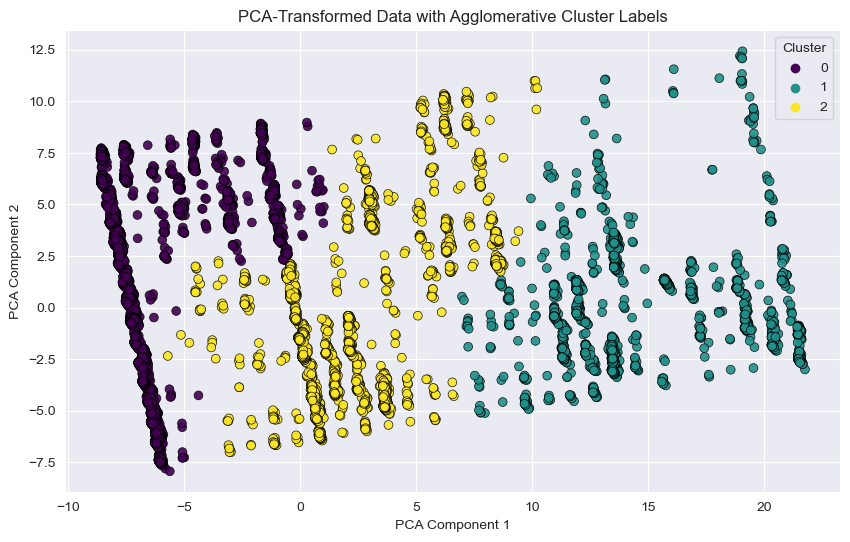

In [84]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=transformed_df[:,0], y=transformed_df[:,1], hue=labels_agg, palette='viridis',s=40,
 alpha=0.9, edgecolor='k')
plt.title('PCA-Transformed Data with Agglomerative Cluster Labels')
plt.xlabel('PCA Component 1') 
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster') 
plt.show()

# Gaussian Mixture

In [85]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=3, random_state=42)
labels_guassian = gmm.fit_predict(transformed_df)


In [86]:
labels_guassian

array([0, 1, 1, ..., 2, 2, 2], dtype=int64)

# Model Evaluation

In [87]:
davies_bouldin_score(transformed_df,labels_guassian)

0.7913309495563556

In [88]:
silhouette_score(transformed_df,labels_guassian)

0.5010465350101445

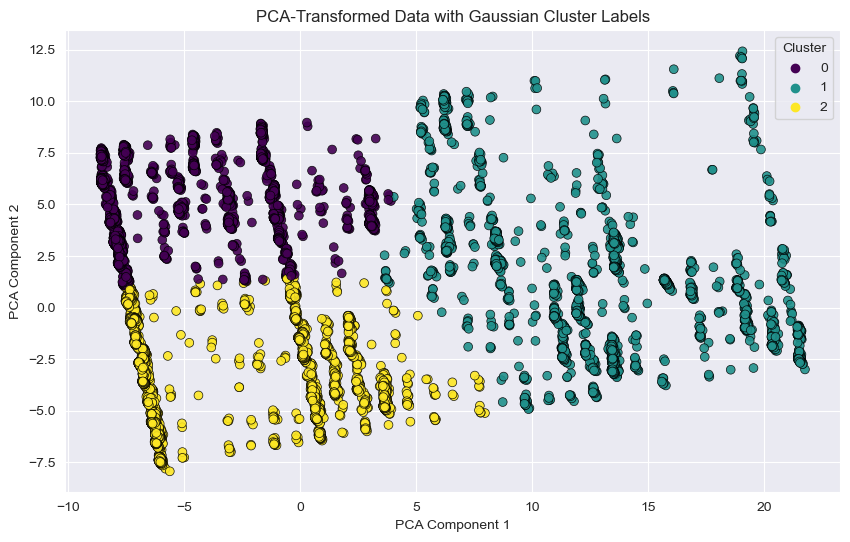

In [89]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=transformed_df[:, 0], y=transformed_df[:, 1], hue=labels_guassian, palette='viridis',s=40,
 alpha=0.9, edgecolor='k')
plt.title('PCA-Transformed Data with Gaussian Cluster Labels')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.show()

# Model Comparison Report

In [90]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
import plotly.express as px
import dash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output


In [91]:
app = dash.Dash(__name__)

# Define the app layout
app.layout = html.Div(children=[
    html.H1(children='Model Comparison Report'),
    dcc.Dropdown(
        id='model-dropdown',
        options=[
            {'label': 'KMeans', 'value': 'KMeans'},
            {'label': 'Hierarchical Clustering', 'value': 'Hierarchical'},
            {'label': 'Gaussian Mixture', 'value': 'GMM'}
        ],
        value='KMeans'
    ),
    dcc.Graph(
        id='cluster-graph', style={'width': '90vw', 'height': '90vh'}
    )
])

# Define callback function to update graph based on dropdown selection
@app.callback(
    Output('cluster-graph', 'figure'),
    Input('model-dropdown', 'value')
)
def update_graph(selected_model):
    if selected_model == 'KMeans':
        labels = labels_kmeans
        title = 'PCA-Transformed Data with KMeans Cluster Labels'
    elif selected_model == 'Hierarchical':
        labels = labels_agg
        title = 'PCA-Transformed Data with Hierarchical Cluster Labels'
    else:
        labels = labels_guassian
        title = 'PCA-Transformed Data with Gaussian Mixture Cluster Labels'

    fig = px.scatter(
        x=transformed_df[:, 0],
        y=transformed_df[:, 1],
        color=labels,
        title=title,
        labels={'x': 'PCA Component 1', 'y': 'PCA Component 2'}
    )
    return fig

if __name__ == '__main__':
    app.run_server(debug=True)

In [92]:
import plotly.graph_objects as go
import pandas as pd

# Data
models = ['KMeans', 'Hierarchical Clustering', 'Gaussian Mixture']
silhouette_scores = [0.49, 0.44, 0.50]
davies_bouldin_scores = [0.79, 0.92, 0.79]

# Create DataFrame
df = pd.DataFrame({
    'Model': models,
    'Silhouette Score': silhouette_scores,
    'Davies-Bouldin Score': davies_bouldin_scores
})

# Silhouette Scores Bar Chart
fig_silhouette = go.Figure()
fig_silhouette.add_trace(go.Bar(
    x=df['Model'],
    y=df['Silhouette Score'],
    marker_color=['#3498db', '#e74c3c', '#2ecc71'],
    text=df['Silhouette Score'],
    textposition='auto'
))
fig_silhouette.update_layout(
    title='Silhouette Scores of Clustering Models',
    xaxis_title='Model',
    yaxis_title='Silhouette Score',
    template='plotly_white'
)

# Davies-Bouldin Scores Bar Chart
fig_davies_bouldin = go.Figure()
fig_davies_bouldin.add_trace(go.Bar(
    x=df['Model'],
    y=df['Davies-Bouldin Score'],
    marker_color=['#3498db', '#e74c3c', '#2ecc71'],
    text=df['Davies-Bouldin Score'],
    textposition='auto'
))
fig_davies_bouldin.update_layout(
    title='Davies-Bouldin Scores of Clustering Models',
    xaxis_title='Model',
    yaxis_title='Davies-Bouldin Score',
    template='plotly_white'
)

# Display the plots
fig_silhouette.show()
fig_davies_bouldin.show()


In [93]:
clustering_algorithms = {
 'KMeans': KMeans(n_clusters=3, random_state=42),
 'AgglomerativeClustering': AgglomerativeClustering(n_clusters=3),
 'GaussianMixture': GaussianMixture(n_components=3, random_state=42)
}
metric1 =[]
metric2 =[]
for name, algorithm in clustering_algorithms.items():
     if name == 'GaussianMixture':
         labels = algorithm.fit_predict(transformed_df)
 
     else:
         labels = algorithm.fit_predict(transformed_df)
 
     silhouette_avg = silhouette_score(transformed_df, labels)
     davies_bouldin_avg = davies_bouldin_score(transformed_df, labels)

     metric1.append(silhouette_avg)
     metric2.append(davies_bouldin_avg)

In [94]:
print('Model Name :','KMeans')
print('Silhouette Score:', metric1[0])
print('Davies Bouldin score:', metric2[0])
print('='*75)
print('Model Name :','Hierarchical Clustering')
print('Silhouette Score:', metric1[1])
print('Davies Bouldin score:', metric2[1])
print('='*75)
print('Model Name :','GaussianMixture')
print('Silhouette Score:', metric1[2])
print('Davies Bouldin score:', metric2[2])

Model Name : KMeans
Silhouette Score: 0.49993404374301836
Davies Bouldin score: 0.7992242332133581
Model Name : Hierarchical Clustering
Silhouette Score: 0.44519007171746283
Davies Bouldin score: 0.9226401477582405
Model Name : GaussianMixture
Silhouette Score: 0.5010465350101445
Davies Bouldin score: 0.7913309495563556


# Conclusion

## Davies-Bouldin Index (DBI)
Lower values indicate better clustering.

## Silhouette Score
Higher values indicate better-defined clusters.

This report provides a comparative analysis of three clustering models: KMeans, Hierarchical Clustering, and Gaussian Mixture. Each model was evaluated using two metrics: the Silhouette Score and the Davies-Bouldin Score.

### KMeans Clustering
- **Silhouette Score**: 0.49
- **Davies-Bouldin Score**: 0.79

#### Analysis:
- **Silhouette Score**: The silhouette score of 0.49 suggests that the clusters formed by KMeans are moderately well-defined. A score close to 0.5 indicates that the data points are relatively well-clustered, with reasonable separation between clusters.
- **Davies-Bouldin Score**: A Davies-Bouldin score of 0.79 indicates good clustering performance, as lower values signify better-defined clusters with minimal overlap. This score suggests that the clusters are compact and distinct.

#### Conclusion:
KMeans performs well in terms of both the silhouette score and the Davies-Bouldin score. The clusters are moderately well-separated, making KMeans a reliable choice for clustering in this context.

### Hierarchical Clustering
- **Silhouette Score**: 0.44
- **Davies-Bouldin Score**: 0.92

#### Analysis:
- **Silhouette Score**: The silhouette score of 0.44 is slightly lower than that of KMeans, indicating that the clusters are less well-defined and there is more overlap between clusters.
- **Davies-Bouldin Score**: A score of 0.92 is higher compared to KMeans, suggesting that the clusters are less compact and more dispersed, which may indicate poorer clustering performance.

#### Conclusion:
Hierarchical Clustering shows weaker performance in both the silhouette score and the Davies-Bouldin score compared to KMeans. The clusters are less distinct, which may lead to more ambiguity in cluster assignment. Therefore, it may not be the best option for clustering in this scenario.

### Gaussian Mixture
- **Silhouette Score**: 0.50
- **Davies-Bouldin Score**: 0.79

#### Analysis:
- **Silhouette Score**: The silhouette score of 0.50 is the highest among the three models, suggesting that the clusters are well-defined with clear separation.
- **Davies-Bouldin Score**: A score of 0.79, the lowest among the three models, indicates that the clusters are compact and distinct, further reinforcing the good performance of the Gaussian Mixture model.

#### Conclusion:
Gaussian Mixture performs the best in terms of both the silhouette score and the Davies-Bouldin score. The clusters are the most well-defined and distinct among the three models, making it the most effective clustering method for this dataset.

## Final Conclusion
In conclusion, for the given dataset, Gaussian Mixture is recommended as the most effective clustering model, followed by KMeans. Hierarchical Clustering may not be suitable due to its relatively poorer performance in defining distinct clusters.

# Challenges Faced

### Missing Values
The dataset contained missing values that needed to be handled appropriately. Missing values can distort the clustering results if not addressed.

### Feature Selection
Selecting relevant features while avoiding redundancy was crucial. Irrelevant or highly correlated features can negatively impact the clustering performance.

### Normalization
Ensuring all features were on a comparable scale was necessary to prevent features with larger ranges from dominating the clustering process.

### Curse of Dimensionality
High-dimensional data can lead to issues such as the distance metrics becoming less meaningful, which can affect the clustering results. Dimensionality reduction techniques like PCA (Principal Component Analysis) were considered but balancing dimensionality reduction with the retention of meaningful information was challenging.

# Model-Specific Challenges

### K-Means Clustering
- **Initialization Sensitivity**: The final clusters can be sensitive to the initial choice of centroids, leading to different results in different runs.
- **Cluster Shape**: K-Means assumes spherical clusters of similar size, which may not always be the case in real-world data.

### Agglomerative Hierarchical Clustering
- **Scalability**: This method is computationally intensive and scales poorly with large datasets, making it challenging to apply to a dataset as large as FIFA20 without substantial computational resources.
- **Number of Clusters**: Determining the number of clusters from the dendrogram can be subjective.

### Gaussian Mixture Models (GMM)
- **Complexity**: GMM is computationally more complex and can suffer from convergence issues, particularly with large datasets.
- **Cluster Shape Assumptions**: GMM assumes clusters follow a Gaussian distribution, which may not hold true for all clusters in the dataset.
